# Apartat B

## 1. EDA (Exploratory Data Analysis)

In [65]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import scipy
import sklearn

# Visualitzarem 4 decimals per mostra
pd.set_option('display.float_format', lambda x: '%.4f' % x)


dataset0 = pd.read_csv("0.csv", header=0, delimiter=',', decimal=".", names=["1.1","1.2","1.3","1.4","1.5","1.6","1.7", "1.8", "2.1","2.2","2.3","2.4","2.5","2.6","2.7", "2.8","3.1","3.2","3.3","3.4","3.5","3.6","3.7", "3.8","4.1","4.2","4.3","4.4","4.5","4.6","4.7", "4.8","5.1","5.2","5.3","5.4","5.5","5.6","5.7", "5.8","6.1","6.2","6.3","6.4","6.5","6.6","6.7", "6.8","7.1","7.2","7.3","7.4","7.5","7.6","7.7", "7.8","8.1","8.2","8.3","8.4","8.5","8.6","8.7", "8.8", "GESTO"])
dataset1 = pd.read_csv("1.csv", header=0, delimiter=',', decimal=".", names=["1.1","1.2","1.3","1.4","1.5","1.6","1.7", "1.8", "2.1","2.2","2.3","2.4","2.5","2.6","2.7", "2.8","3.1","3.2","3.3","3.4","3.5","3.6","3.7", "3.8","4.1","4.2","4.3","4.4","4.5","4.6","4.7", "4.8","5.1","5.2","5.3","5.4","5.5","5.6","5.7", "5.8","6.1","6.2","6.3","6.4","6.5","6.6","6.7", "6.8","7.1","7.2","7.3","7.4","7.5","7.6","7.7", "7.8","8.1","8.2","8.3","8.4","8.5","8.6","8.7", "8.8", "GESTO"])
dataset2 = pd.read_csv("2.csv", header=0, delimiter=',', decimal=".", names=["1.1","1.2","1.3","1.4","1.5","1.6","1.7", "1.8", "2.1","2.2","2.3","2.4","2.5","2.6","2.7", "2.8","3.1","3.2","3.3","3.4","3.5","3.6","3.7", "3.8","4.1","4.2","4.3","4.4","4.5","4.6","4.7", "4.8","5.1","5.2","5.3","5.4","5.5","5.6","5.7", "5.8","6.1","6.2","6.3","6.4","6.5","6.6","6.7", "6.8","7.1","7.2","7.3","7.4","7.5","7.6","7.7", "7.8","8.1","8.2","8.3","8.4","8.5","8.6","8.7", "8.8", "GESTO"])
dataset3 = pd.read_csv("3.csv", header=0, delimiter=',', decimal=".", names=["1.1","1.2","1.3","1.4","1.5","1.6","1.7", "1.8", "2.1","2.2","2.3","2.4","2.5","2.6","2.7", "2.8","3.1","3.2","3.3","3.4","3.5","3.6","3.7", "3.8","4.1","4.2","4.3","4.4","4.5","4.6","4.7", "4.8","5.1","5.2","5.3","5.4","5.5","5.6","5.7", "5.8","6.1","6.2","6.3","6.4","6.5","6.6","6.7", "6.8","7.1","7.2","7.3","7.4","7.5","7.6","7.7", "7.8","8.1","8.2","8.3","8.4","8.5","8.6","8.7", "8.8", "GESTO"])

dataset = pd.concat([dataset0, dataset1])
dataset = pd.concat([dataset, dataset2])
dataset = pd.concat([dataset, dataset3])
dataset = dataset.reset_index()

data = dataset.values
x = data[:, :-1]
y = data[:, -1]

print("Dimensionalitat de la BBDD:", dataset.shape)
print("Dimensionalitat de les entrades X", x.shape)
print("Dimensionalitat de l'atribut Y", y.shape)

Dimensionalitat de la BBDD: (11674, 66)
Dimensionalitat de les entrades X (11674, 65)
Dimensionalitat de l'atribut Y (11674,)


In [66]:
dataset3.head()

,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,2.1,2.2,...,7.8,8.1,8.2,8.3,8.4,8.5,8.6,8.7,8.8,GESTO
0,-7.0000,0.0000,1.0000,0.0000,-13.0000,-18.0000,0.0000,-9.0000,-6.0000,-2.0000,...,-1.0000,11.0000,-4.0000,-5.0000,-4.0000,3.0000,-8.0000,-7.0000,-3.0000,3
1,-6.0000,-6.0000,-6.0000,-8.0000,25.0000,43.0000,-4.0000,7.0000,6.0000,1.0000,...,3.0000,2.0000,1.0000,3.0000,-1.0000,1.0000,9.0000,4.0000,4.0000,3
2,2.0000,1.0000,1.0000,1.0000,0.0000,-23.0000,2.0000,-6.0000,-1.0000,-2.0000,...,16.0000,-3.0000,-1.0000,-1.0000,-3.0000,0.0000,-3.0000,4.0000,3.0000,3
3,0.0000,3.0000,4.0000,5.0000,1.0000,25.0000,-9.0000,0.0000,0.0000,1.0000,...,1.0000,6.0000,2.0000,1.0000,-3.0000,-20.0000,-42.0000,-4.0000,2.0000,3
4,-11.0000,-2.0000,-5.0000,1.0000,-7.0000,-11.0000,-4.0000,-23.0000,-9.0000,0.0000,...,-4.0000,9.0000,1.0000,2.0000,8.0000,21.0000,41.0000,15.0000,9.0000,3


In [67]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11674 entries, 0 to 11673
Data columns (total 66 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   index   11674 non-null  int64  
 1   1.1     11674 non-null  float64
 2   1.2     11674 non-null  float64
 3   1.3     11674 non-null  float64
 4   1.4     11674 non-null  float64
 5   1.5     11674 non-null  float64
 6   1.6     11674 non-null  float64
 7   1.7     11674 non-null  float64
 8   1.8     11674 non-null  float64
 9   2.1     11674 non-null  float64
 10  2.2     11674 non-null  float64
 11  2.3     11674 non-null  float64
 12  2.4     11674 non-null  float64
 13  2.5     11674 non-null  float64
 14  2.6     11674 non-null  float64
 15  2.7     11674 non-null  float64
 16  2.8     11674 non-null  float64
 17  3.1     11674 non-null  float64
 18  3.2     11674 non-null  float64
 19  3.3     11674 non-null  float64
 20  3.4     11674 non-null  float64
 21  3.5     11674 non-null  float64
 22

In [68]:
dataset.head()

,index,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,2.1,...,7.8,8.1,8.2,8.3,8.4,8.5,8.6,8.7,8.8,GESTO
0,0,-47.0000,-6.0000,-5.0000,-7.0000,13.0000,-1.0000,35.0000,-10.0000,10.0000,...,-25.0000,47.0000,6.0000,6.0000,5.0000,13.0000,21.0000,111.0000,15.0000,0
1,1,-19.0000,-8.0000,-8.0000,-8.0000,-21.0000,-6.0000,-79.0000,12.0000,0.0000,...,-83.0000,7.0000,7.0000,1.0000,-8.0000,7.0000,21.0000,114.0000,48.0000,0
2,2,2.0000,3.0000,0.0000,2.0000,0.0000,22.0000,106.0000,-14.0000,-16.0000,...,-38.0000,-11.0000,4.0000,7.0000,11.0000,33.0000,39.0000,119.0000,43.0000,0
3,3,6.0000,0.0000,0.0000,-2.0000,-14.0000,10.0000,-51.0000,5.0000,7.0000,...,38.0000,-35.0000,-8.0000,2.0000,6.0000,-13.0000,-24.0000,-112.0000,-69.0000,0
4,4,15.0000,-5.0000,-5.0000,-15.0000,12.0000,-22.0000,-38.0000,36.0000,9.0000,...,-26.0000,5.0000,6.0000,6.0000,11.0000,5.0000,30.0000,-48.0000,25.0000,0


In [69]:
dataset.describe()

,index,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,2.1,...,7.8,8.1,8.2,8.3,8.4,8.5,8.6,8.7,8.8,GESTO
count,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,...,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000,11674.0000
mean,1458.7894,-0.5206,-0.7282,-0.7384,-0.7300,-0.1598,-0.5523,-1.2630,-0.6550,-0.6657,...,-0.9310,-0.8396,-0.7403,-0.7687,-0.7057,-0.1483,-0.3780,-1.4438,-0.6093,1.5033
std,842.6029,18.5671,11.7671,4.9897,7.4423,17.8521,25.8103,25.0744,15.3982,18.1266,...,15.1589,18.1977,12.0071,4.9697,7.3853,17.8419,25.5540,25.2584,15.5316,1.1175
min,0.0000,-116.0000,-104.0000,-33.0000,-75.0000,-121.0000,-122.0000,-128.0000,-128.0000,-110.0000,...,-128.0000,-116.0000,-128.0000,-46.0000,-74.0000,-103.0000,-128.0000,-128.0000,-124.0000,0.0000
25%,729.0000,-9.0000,-4.0000,-3.0000,-4.0000,-10.0000,-15.0000,-6.0000,-8.0000,-9.0000,...,-8.0000,-9.0000,-4.0000,-3.0000,-4.0000,-10.0000,-14.0000,-6.0000,-8.0000,1.0000
50%,1459.0000,-1.0000,-1.0000,-1.0000,-1.0000,0.0000,-1.0000,-1.0000,-1.0000,-1.0000,...,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,0.0000,-1.0000,-1.0000,-1.0000,2.0000
75%,2188.0000,7.0000,3.0000,2.0000,3.0000,10.0000,13.0000,4.0000,6.0000,6.0000,...,6.0000,6.0000,3.0000,2.0000,3.0000,10.0000,13.0000,3.0000,6.0000,3.0000
max,2941.0000,111.0000,90.0000,34.0000,55.0000,92.0000,127.0000,127.0000,126.0000,127.0000,...,114.0000,127.0000,105.0000,29.0000,51.0000,110.0000,127.0000,127.0000,127.0000,3.0000


### Heatmaps

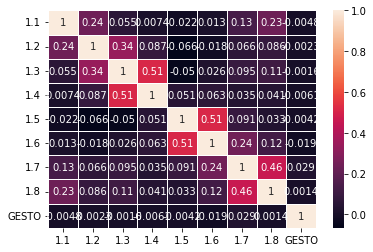

In [70]:
dataset1 = dataset[["1.1","1.2","1.3","1.4","1.5","1.6","1.7", "1.8", "GESTO"]].copy()
dataset2 = dataset[["2.1","2.2","2.3","2.4","2.5","2.6","2.7", "2.8", "GESTO"]].copy()
dataset3 = dataset[["3.1","3.2","3.3","3.4","3.5","3.6","3.7", "3.8", "GESTO"]].copy()
dataset4 = dataset[["4.1","4.2","4.3","4.4","4.5","4.6","4.7", "4.8", "GESTO"]].copy()
dataset5 = dataset[["5.1","5.2","5.3","5.4","5.5","5.6","5.7", "5.8", "GESTO"]].copy()
dataset6 = dataset[["6.1","6.2","6.3","6.4","6.5","6.6","6.7", "6.8", "GESTO"]].copy()
dataset7 = dataset[["7.1","7.2","7.3","7.4","7.5","7.6","7.7", "7.8", "GESTO"]].copy()
dataset8 = dataset[["8.1","8.2","8.3","8.4","8.5","8.6","8.7", "8.8", "GESTO"]].copy()
co1 = dataset1.corr()
co2 = dataset2.corr()
co3 = dataset3.corr()
co4 = dataset4.corr()
co5 = dataset5.corr()
co6 = dataset6.corr()
co7 = dataset7.corr()
co8 = dataset8.corr()

plt.figure()

ax1 = sns.heatmap(co1, annot=True, linewidths=.5)

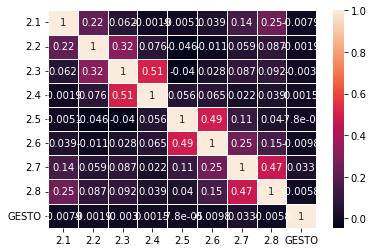

In [71]:
ax2 = sns.heatmap(co2, annot=True, linewidths=.5)

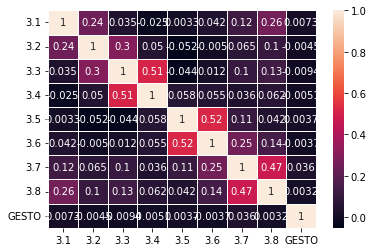

In [72]:
ax3 = sns.heatmap(co3, annot=True, linewidths=.5)

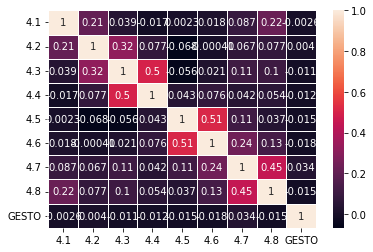

In [73]:
ax4 = sns.heatmap(co4, annot=True, linewidths=.5)

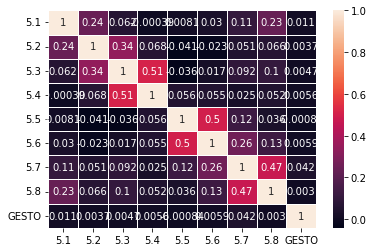

In [74]:
ax5 = sns.heatmap(co5, annot=True, linewidths=.5)

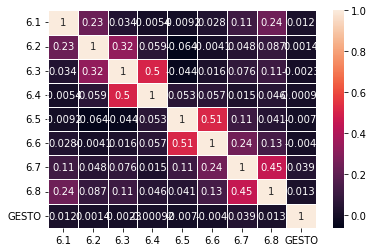

In [75]:
ax6 = sns.heatmap(co6, annot=True, linewidths=.5)

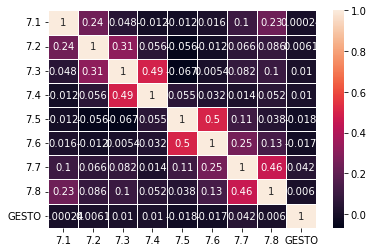

In [76]:
ax7 = sns.heatmap(co7, annot=True, linewidths=.5)

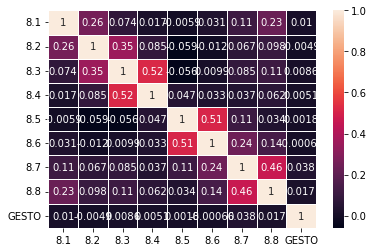

In [77]:
ax8 = sns.heatmap(co8, annot=True, linewidths=.5)

### Histogrames i pairplots

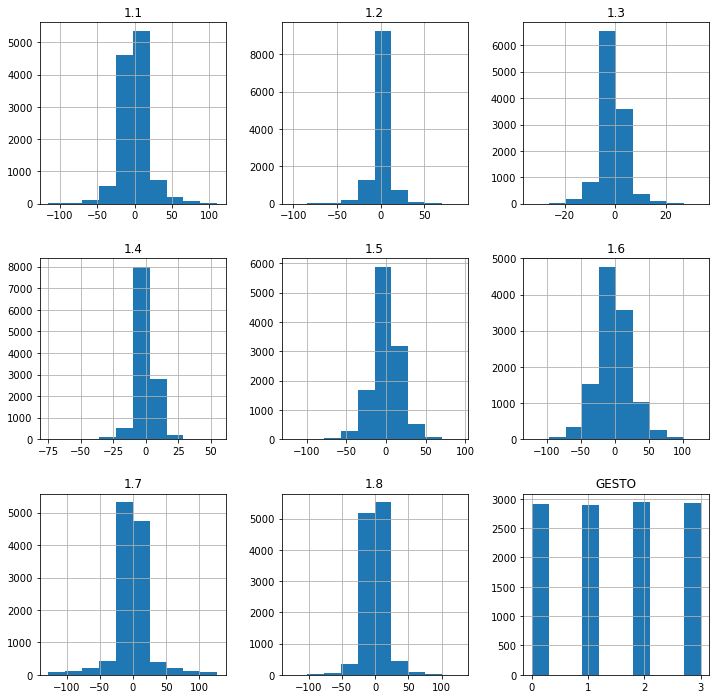

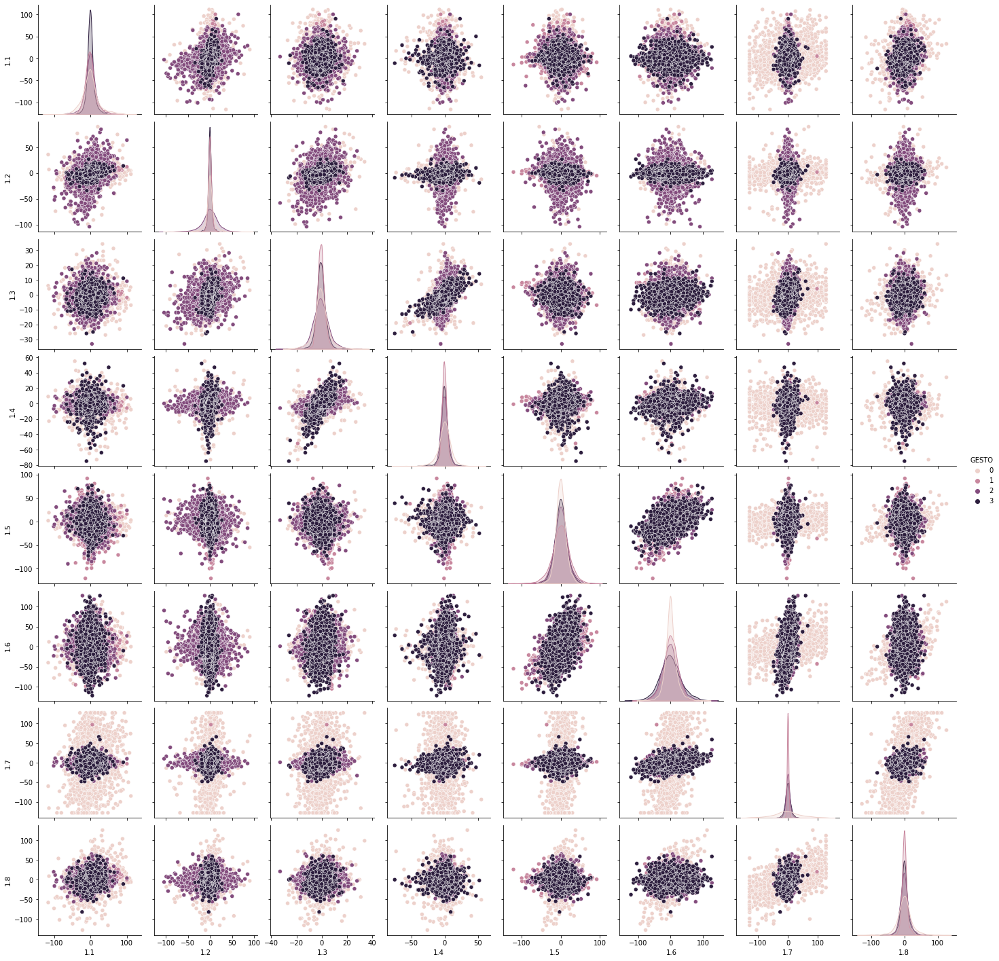

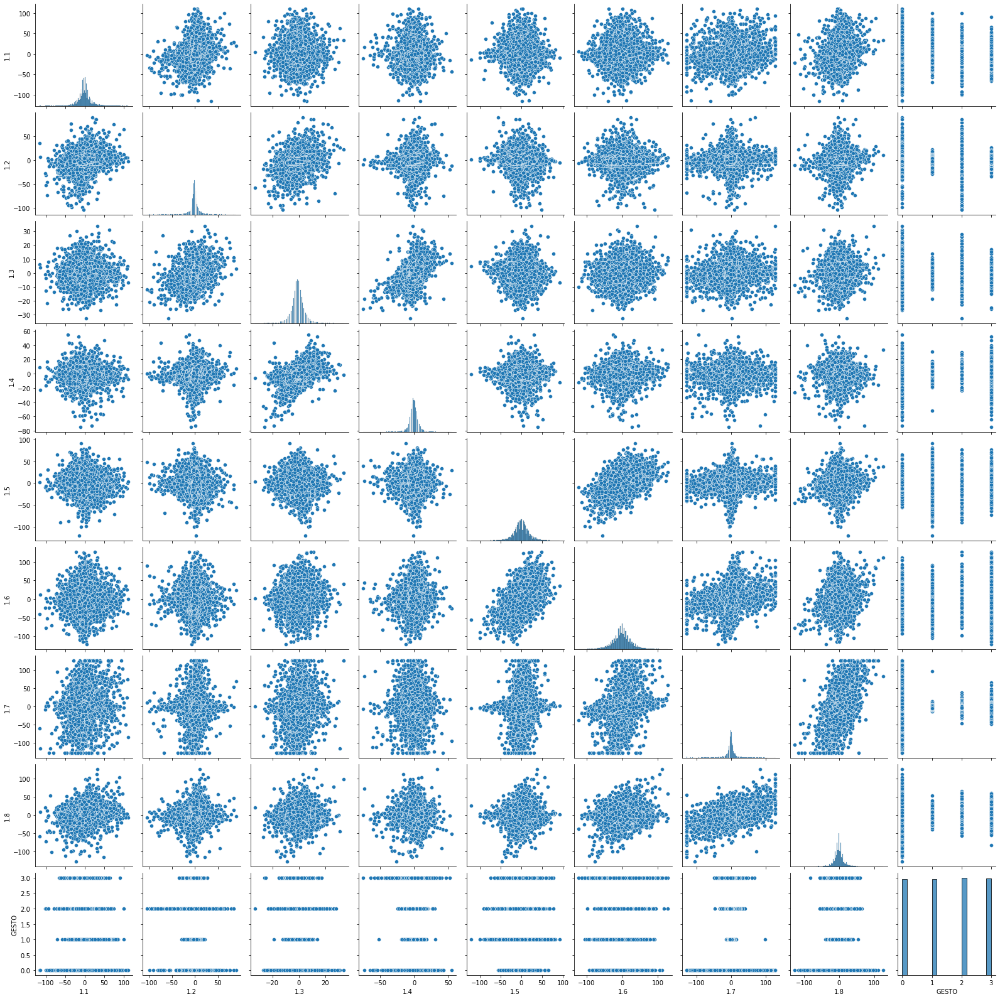

In [88]:
dataset1.hist(figsize=(12, 12))
rel1 = sns.pairplot(dataset1, hue='GESTO')
relx = sns.pairplot(dataset1)

#DECIDIR SI NOS QUEDAMOS CON EL PAIRPLOT NORMAL O CON EL HUE(EL DE COLORES)

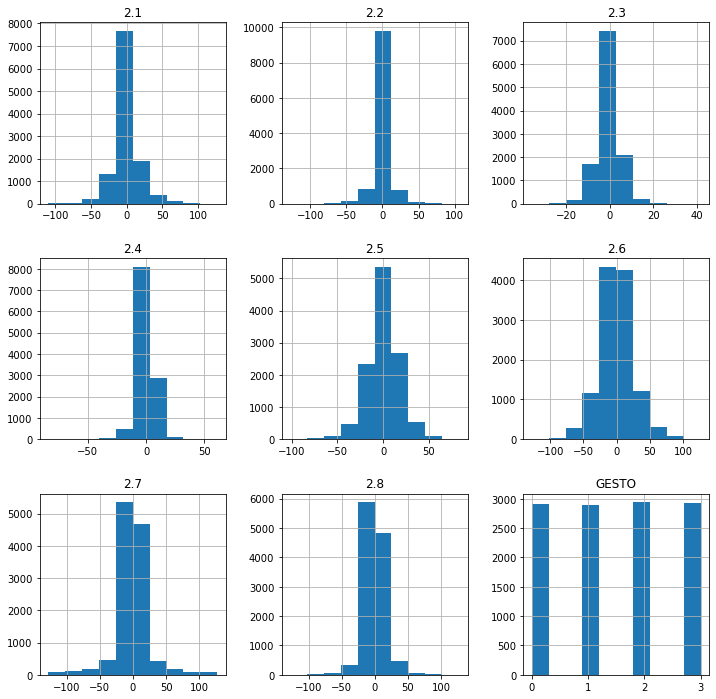

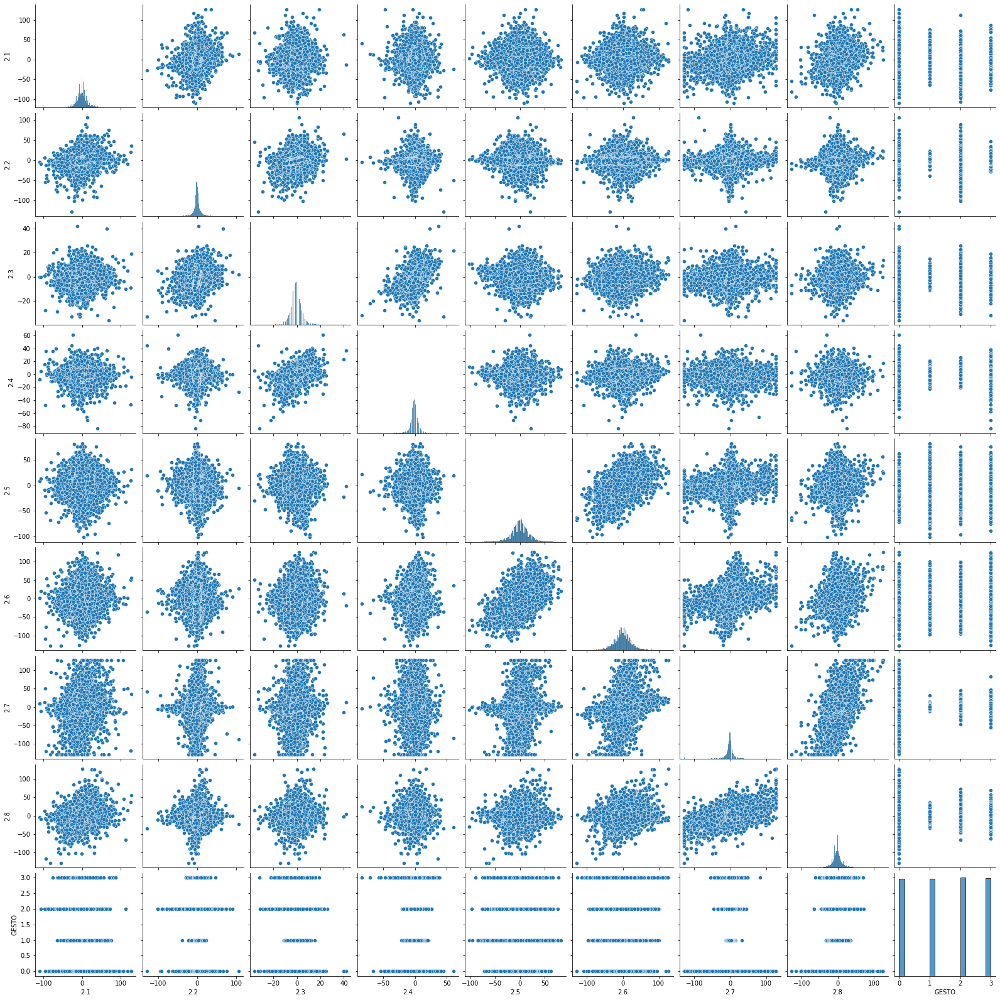

In [79]:
dataset2.hist(figsize=(12, 12))
rel2 = sns.pairplot(dataset2)

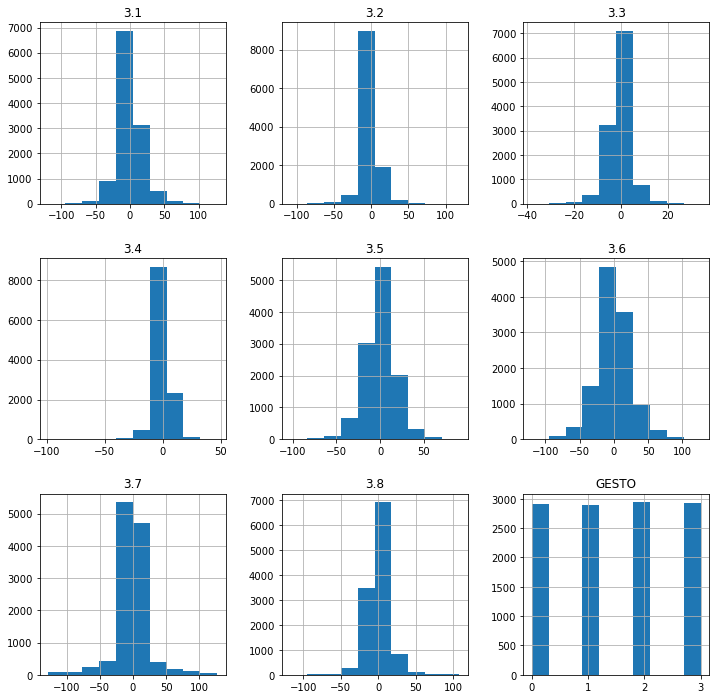

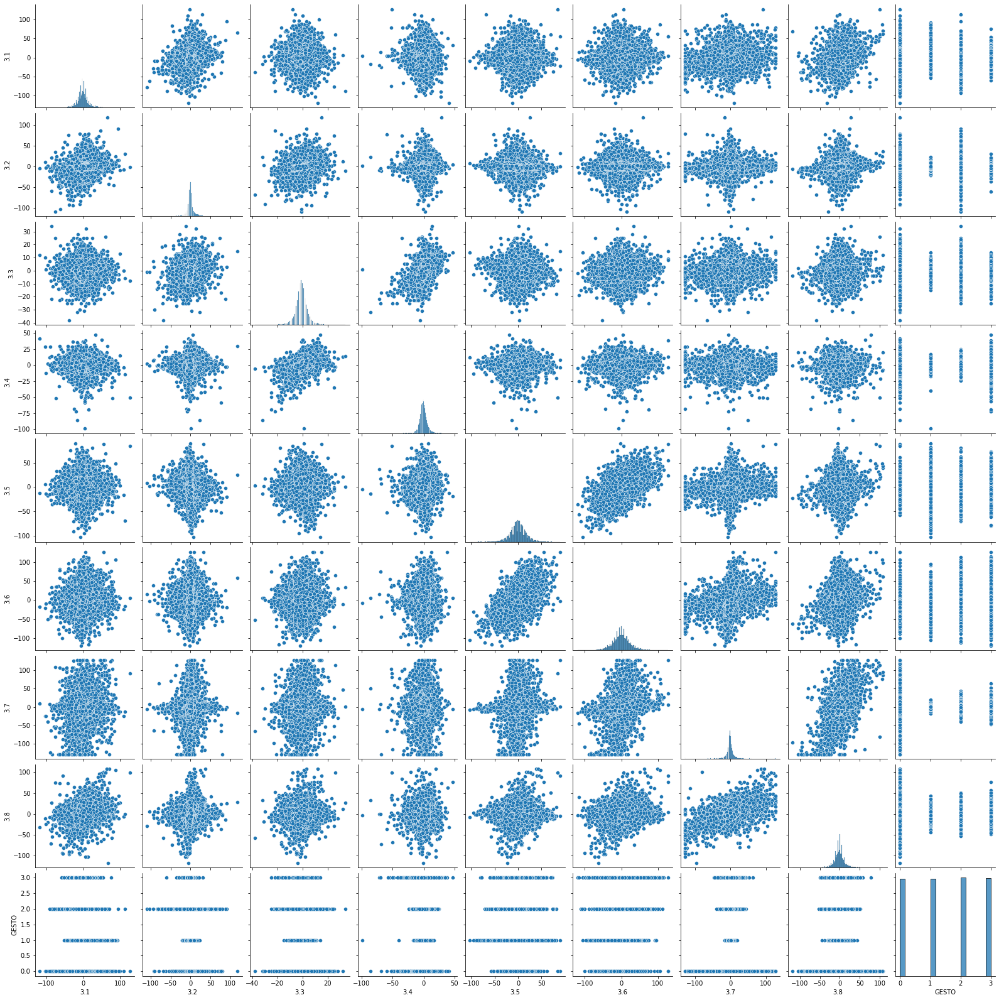

In [80]:
dataset3.hist(figsize=(12, 12))
rel3 = sns.pairplot(dataset3)

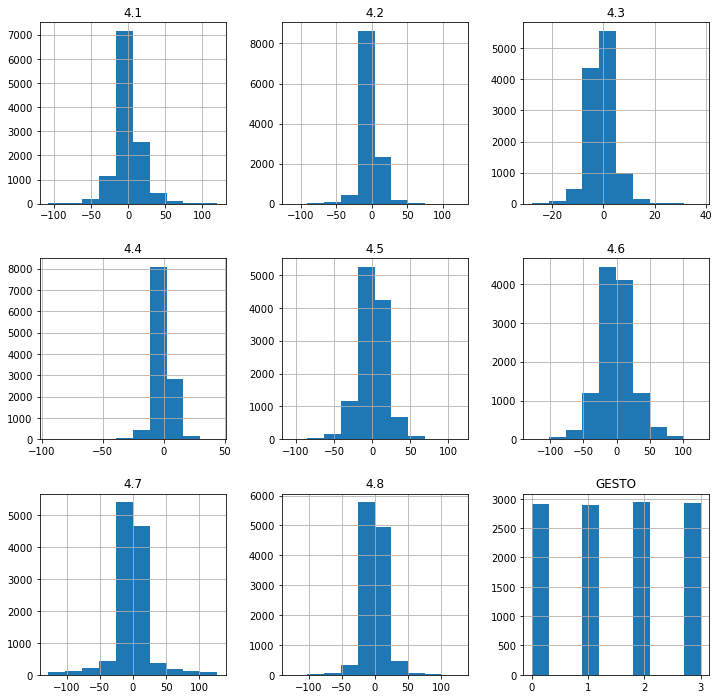

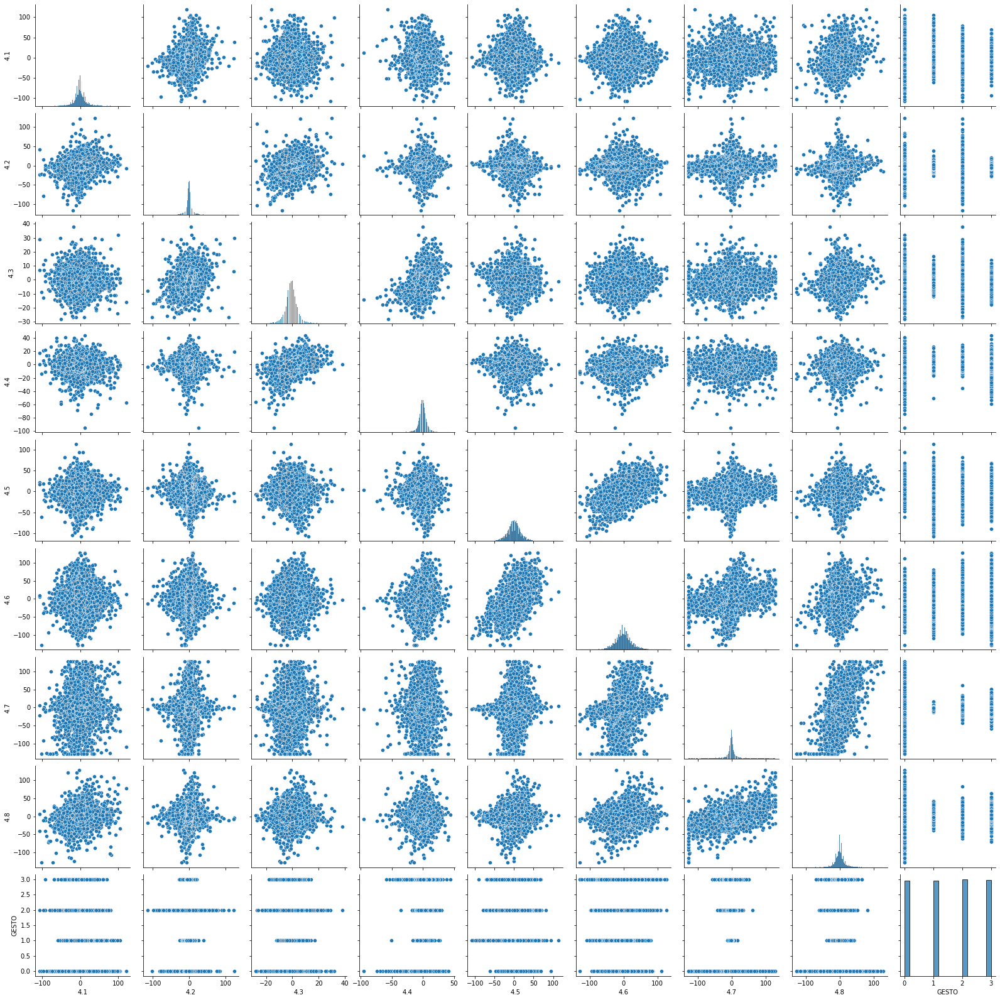

In [81]:
dataset4.hist(figsize=(12, 12))
rel4 = sns.pairplot(dataset4)

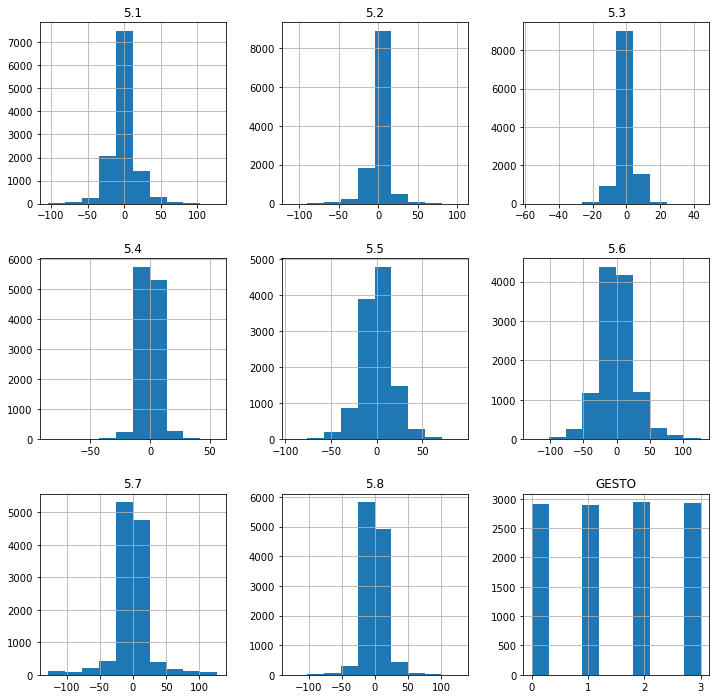

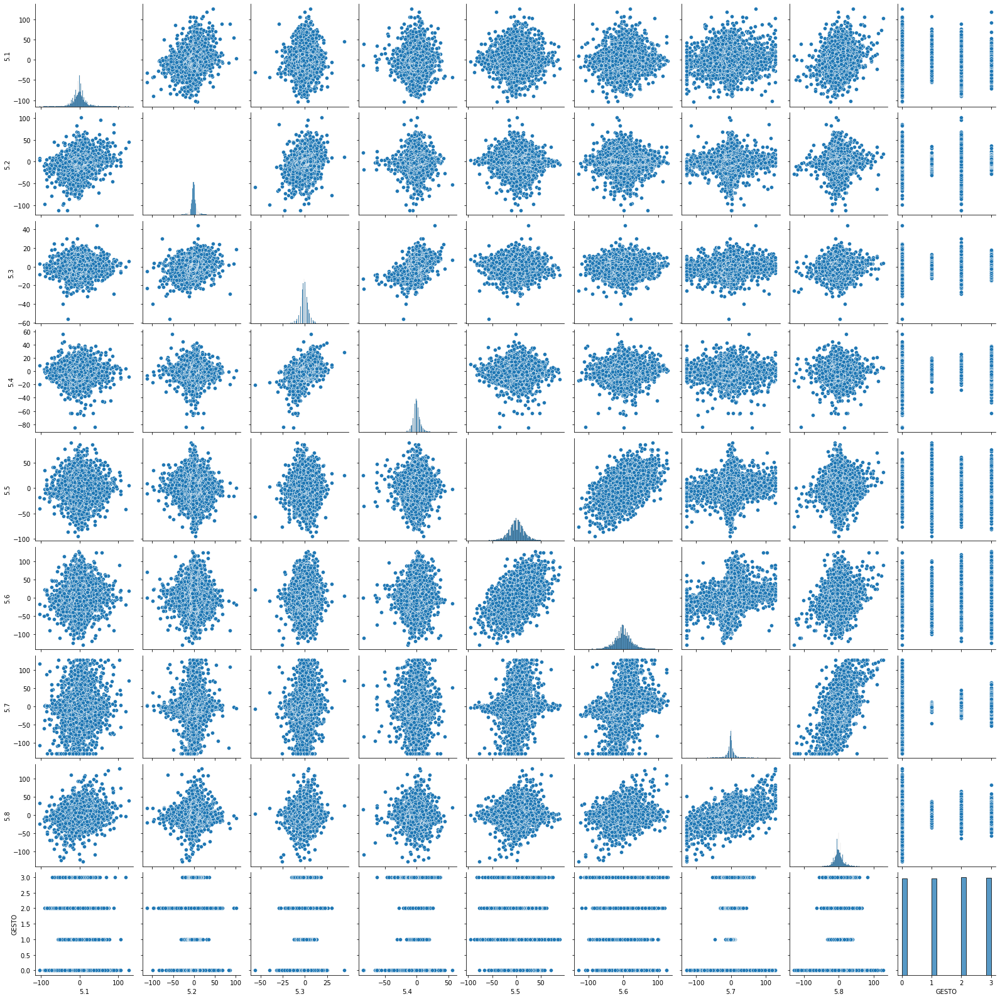

In [82]:
dataset5.hist(figsize=(12, 12))
rel5 = sns.pairplot(dataset5)

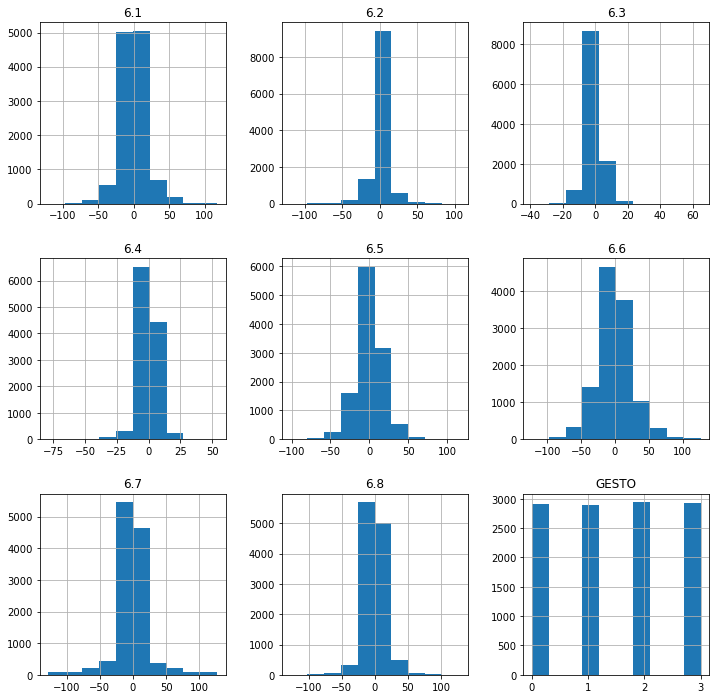

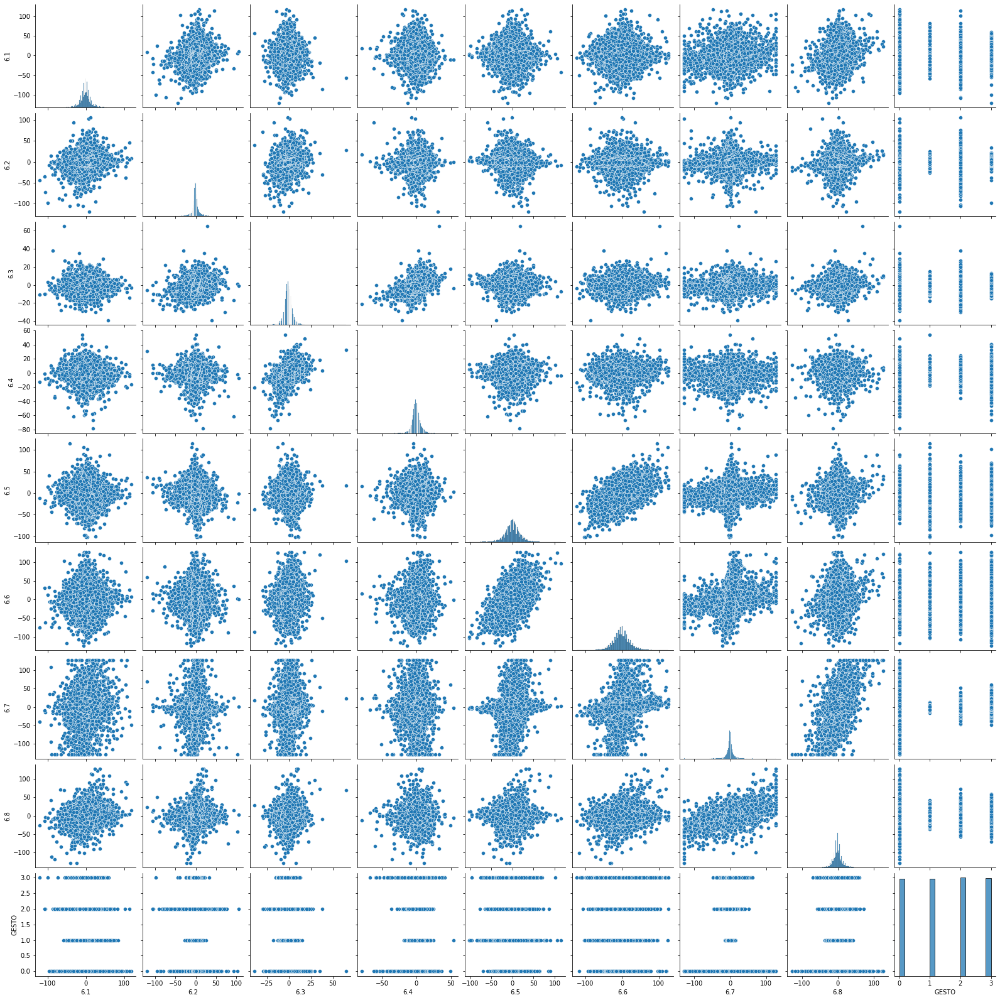

In [83]:
dataset6.hist(figsize=(12, 12))
rel6 = sns.pairplot(dataset6)

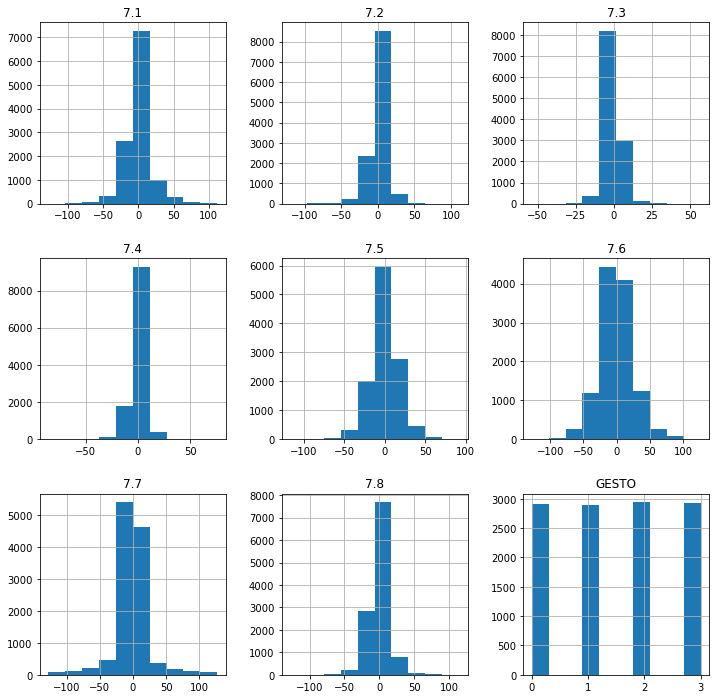

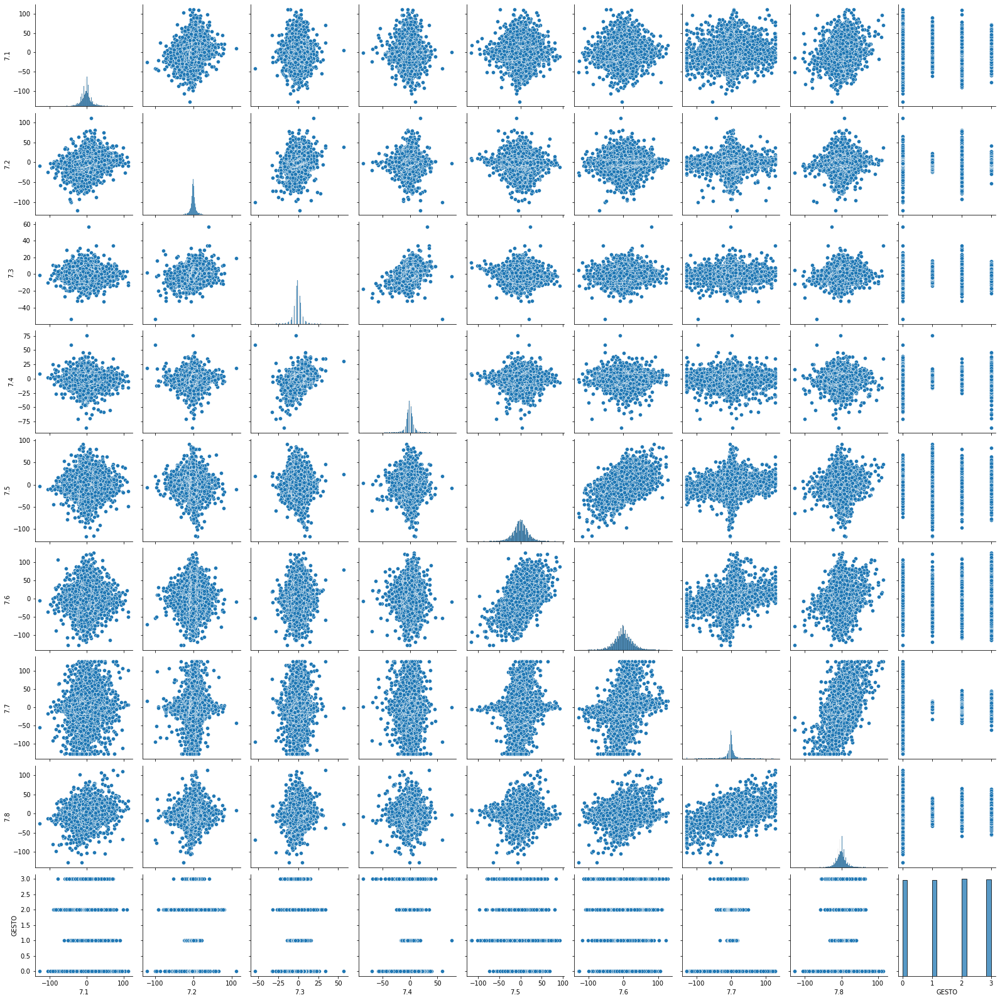

In [84]:
dataset7.hist(figsize=(12, 12))
rel7 = sns.pairplot(dataset7)

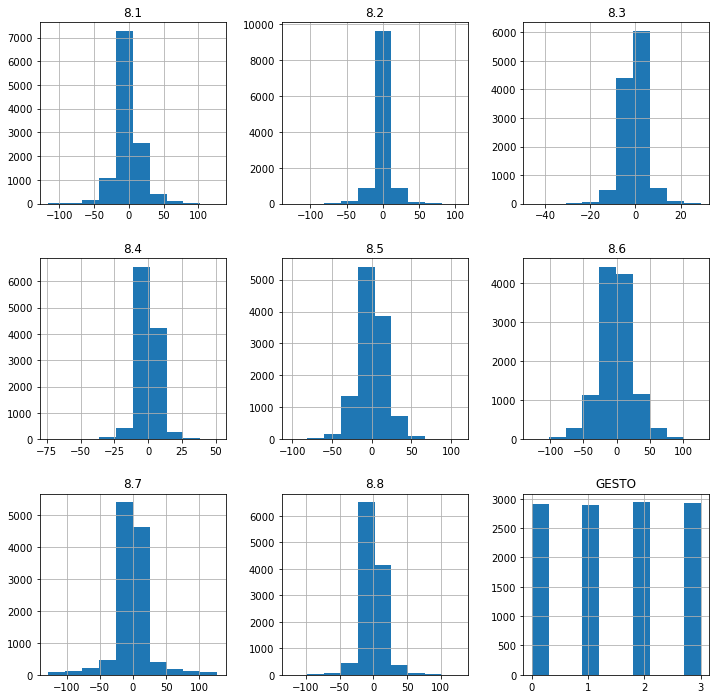

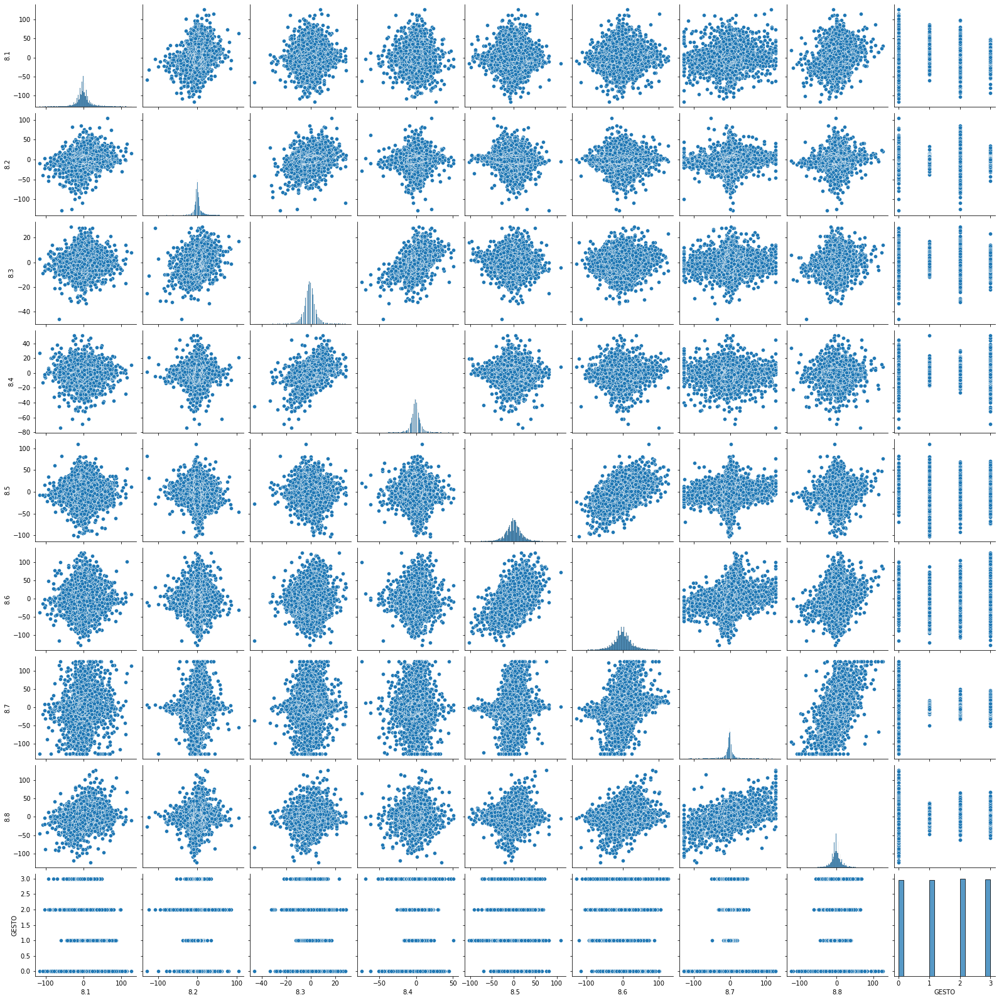

In [85]:
dataset8.hist(figsize=(12, 12))
rel8 = sns.pairplot(dataset8)

## 2. Preprocessing (normalitzation, outlier removal, feature selection..)

In [ ]:
#HACER STRATIFIED KFOLD